In [1]:
from audioutils import *

In [2]:
# import os

# def set_threads(
#     num_threads,
#     set_blas_threads=True,
#     set_numexpr_threads=True,
#     set_openmp_threads=True
# ):
#     num_threads = str(num_threads)
#     if not num_threads.isdigit():
#         raise ValueError("Number of threads must be an integer.")
#     if set_blas_threads:
#         os.environ["OPENBLAS_NUM_THREADS"] = num_threads
#         os.environ["MKL_NUM_THREADS"] = num_threads
#         os.environ["VECLIB_MAXIMUM_THREADS"] = num_threads
#     if set_numexpr_threads:
#         os.environ["NUMEXPR_NUM_THREADS"] = num_threads
#     if set_openmp_threads:
#         os.environ["OMP_NUM_THREADS"] = num_threads

# set_threads(1)

In [3]:
import numpy as np
import wavio
import math
import matplotlib.pyplot as plt
import pandas as pd
from scipy import signal
from scipy.signal import correlate
import scipy
import numpy.random as rng
from joblib import Parallel, delayed

In [4]:
%pylab inline
pylab.rcParams['figure.figsize'] = (20, 5)

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


/home/bruno/miniconda3/envs/PhasedArrays/lib/python3.9/site-packages/IPython/core/magics/pylab.py:162: UserWarning: pylab import has clobbered these variables: ['correlate']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


In [5]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [6]:
# Parameters
sample_rate = 44100 # Hz

In [7]:
num_sounds = 7

In [8]:
listener_locs = gen_listener_locs(50, 0.1)
source_locs = [(30, 0), (0, 30), (30, 30), (50, 20), (50, 40), (20, 50) ,(20, 10)][:num_sounds]
#source_locs = [(x * 3, y * 3) for x,y in source_locs]

sound_files = [
    "sounds/sound_hellyeah.wav",
    "sounds/humans_are_dead.wav",
    "sounds/sound_memmemem.wav",
    "sounds/sound_bop2.wav",
    "sounds/shpank_you.wav",
    "sounds/sound_grunt_small.wav",
    "sounds/sound_bzzzz.wav",
][:num_sounds]

sounds = [read_wav(f) for f in sound_files]
#sounds = [gen_tone(CHz, 01, sample_rate), gen_tone(GHz, 0.1, sample_rate)]

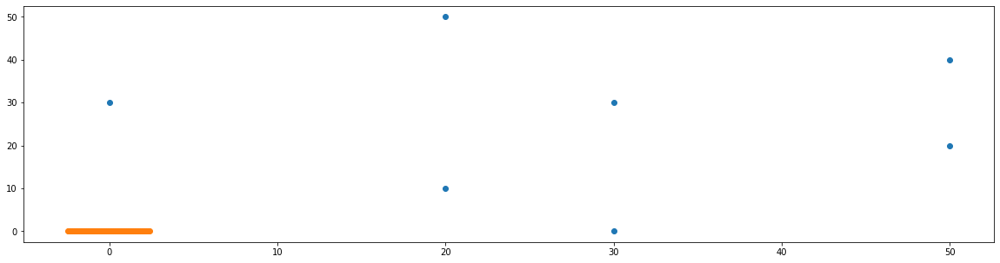

In [9]:
xs, ys = np.array(source_locs).transpose()
plt.scatter(xs, ys, edgecolors=None)
xs, ys = np.array(listener_locs).transpose()
plt.scatter(xs, ys, edgecolors=None)
plt.show()

In [10]:
listener_waves = gen_listener_waves(listener_locs, source_locs, sounds, sample_rate)

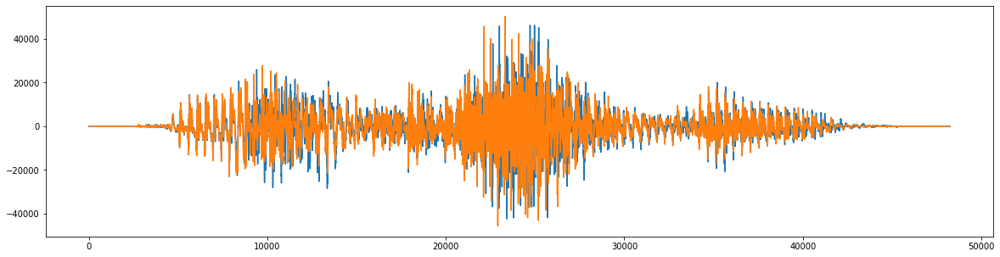

In [11]:
play_tmp(listener_waves[0], sample_rate)
plt.plot(np.array(listener_waves[0]).transpose())
plt.plot(np.array(listener_waves[-1]).transpose())
plt.show()

In [12]:
stereo = np.array(listener_waves).transpose()
wavio.write('stereo.wav', stereo, sample_rate, sampwidth=3)
play('stereo.wav')

In [13]:
focused_waves = [listen_to_coordinates(listener_locs, listener_waves, s_loc, sample_rate) for s_loc in source_locs]

In [14]:
for fw in focused_waves:
    play_tmp(fw, sample_rate)

In [15]:
# for fw in focused_waves:
#     plt.plot(np.array(fw).transpose())
#     plt.show()

In [16]:
def calc_similarity_score(wave1, wave2):
    norm1 = wave1 / np.linalg.norm(wave1)
    norm2 = wave2 / np.linalg.norm(wave2)
    scores = signal.correlate(norm1, norm2, method='fft')
    best_score = np.max(scores)
    
    lags = signal.correlation_lags(len(norm1), len(norm2))
    return best_score

In [17]:
for fw, s in zip(focused_waves, sounds):
    best_score = calc_similarity_score(fw, s)
    print(best_score)

0.7308042939814505
0.9850276788831166
0.5659799496980477
0.13362330359782693
0.8367853285502201
0.9218100085223967
0.46989731284983915


# STUFF HAPPENS HERE

In [29]:
grid_listener_locs = gen_listener_locs(2, 1)
num_grid_x = 20
space_grid_x = 10
grid_locs = [(-space_grid_x*num_grid_x/2 + i*space_grid_x, j*10) for i in range(num_grid_x) for j in range(3)]
max_grid_x = num_grid_x*space_grid_x

In [30]:
sound = [sounds[0]]
listener_waves_grid = []
for loc in grid_locs:
    listener_waves = gen_listener_waves(grid_listener_locs, [loc], sound, sample_rate)
    listener_waves_grid.append(listener_waves)

In [31]:
s_loc = (0, 100)
focused_waves_grid = []
for lg in listener_waves_grid:
    focused_waves = listen_to_coordinates(grid_listener_locs, lg, s_loc, sample_rate)
    focused_waves_grid.append(focused_waves)

In [32]:
# scores_grid = []
# timing_grid = []
# for fw in focused_waves_grid:
#     best_score = calc_similarity_score(fw, sound[0])
#     scores_grid.append(best_score)
# #     print(best_score)

In [33]:
# scores_grid = Parallel(n_jobs=1)(delayed(calc_similarity_score)(fw, sound[0]) for fw in focused_waves_grid)

In [34]:
# scores_grid = Parallel(n_jobs=32)(delayed(calc_similarity_score)(fw, sound[0]) for fw in focused_waves_grid)

In [35]:
# no batch
# 1 = 18.8s
# 2 = 12.0s
# 4 = 7.46s
# 8 = 6.76s
# 16 = 7.03s
# 24 = 7.68s
# 32 = 6.30s

In [36]:
def batched_similarity_score(batch_of_fw, s):
    scores = []
    for fw in batch_of_fw:
        best_score = calc_similarity_score(fw, s)
        scores.append(best_score)
    return scores

In [37]:
np_fw = np.array(pad_even(focused_waves_grid))
np_s = np.array([sounds[0] for _ in range(len(focused_waves_grid))])


In [38]:
np_fw.shape

(60, 35127)

In [75]:
norm1 = np_fw[1] / np.linalg.norm(np_fw[1])
norm2 = np_s[1] / np.linalg.norm(np_s[1])
first_scores = signal.correlate(norm1, norm2, method='fft')
print(first_scores.shape)
first_scores

(57142,)


array([-3.94745964e-18, -1.97372982e-18,  1.57898386e-17, ...,
        6.90805438e-18,  1.28292438e-17,  1.28292438e-17])

In [76]:
num = 3
norm1 = np_fw[0:num] / np.linalg.norm(np_fw[0:num], axis=1).reshape(num,1)
norm2 = np_s[0:num] / np.linalg.norm(np_s[0:num], axis=1).reshape(num,1)
scores = signal.correlate(norm1, norm2, method='fft')
print(scores.shape)
scores

(5, 57142)


array([[ 9.47390314e-18,  1.89478063e-17,  6.31593543e-18, ...,
        -4.73695157e-18, -7.89491929e-19,  2.30926389e-17],
       [ 2.36847579e-18,  1.26318709e-17,  3.94745964e-18, ...,
         5.13169754e-18,  1.97372982e-17, -3.15796771e-18],
       [ 1.89478063e-17,  1.26318709e-17,  9.47390314e-18, ...,
         1.49941745e-08,  8.02381469e-09,  2.94967369e-09],
       [ 1.26318709e-17,  1.26318709e-17,  1.89478063e-17, ...,
         1.49941745e-08,  8.02381470e-09,  2.94967368e-09],
       [-2.36847579e-18, -1.10528870e-17, -1.57898386e-18, ...,
         1.49941745e-08,  8.02381468e-09,  2.94967368e-09]])

In [78]:
for s in scores:
    print(np.mean(s - first_scores))

-8.452495174843076e-09
5.396412096463045e-06
1.0816420068780041e-05
5.420007972317141e-06
1.5143380679034193e-08


In [39]:
norm1 = np_fw / np.linalg.norm(np_fw, axis=1).reshape(60,1)
norm2 = np_s / np.linalg.norm(np_s, axis=1).reshape(60,1)
scores = signal.correlate(norm1, norm2, method='fft')
best_score = np.max(scores)

lags = signal.correlation_lags(len(norm1), len(norm2))
best_score

2.2405782332633675

In [40]:
print(scores.shape)
scores

(119, 57142)


array([[ 1.47371827e-17,  1.68424945e-17,  1.47371827e-17, ...,
         2.90796194e-17,  2.56584877e-17,  2.17110280e-17],
       [ 1.15792150e-17,  2.10531181e-18, -6.31593543e-18, ...,
         7.36859133e-18,  1.42108547e-17,  3.15796771e-18],
       [-2.31584299e-17, -1.68424945e-17, -3.78956126e-17, ...,
         1.49941745e-08,  8.02381468e-09,  2.94967367e-09],
       ...,
       [ 1.26318709e-17,  7.36859133e-18,  5.26327952e-18, ...,
        -1.05265590e-17, -1.47371827e-17,  8.42124724e-18],
       [ 4.63168598e-17,  4.26325641e-17,  4.78958437e-17, ...,
         5.73697468e-17,  6.31593543e-17,  6.23698624e-17],
       [-4.21062362e-18,  0.00000000e+00,  0.00000000e+00, ...,
         5.26327952e-18,  1.68424945e-17,  2.10531181e-17]])

In [27]:
n_jobs = 8
batch_size = len(focused_waves_grid) // n_jobs // 8
scores_batches_grid = Parallel(n_jobs=n_jobs, prefer="threads")(delayed(batched_similarity_score)(focused_waves_grid[i:i+batch_size], sound[0]) for i in range(0, len(focused_waves_grid), batch_size))

scores_grid = []
for s_batch in scores_batches_grid:
    for s in s_batch:
        scores_grid.append(s)

In [54]:
# batch 100
# 1 = 18.1s
# 2 = 11.7s
# 4 = 6.68s
# 8 = 6.71s
# 16 = 7.12s
# 24 = 7.68s

In [55]:
# batch 100 threads
# 1 = 18.3s
# 2 = 9.54s
# 4 = 5.19s
# 8 = 3.93s
# 12 = 4.85s
# 16 = 6.94s
# 24 = 7.19s
# 32 = 8.32s

In [46]:
len(scores_grid)

20000

In [27]:
print('mean: ', np.mean(timing_grid))
print('sum: ', np.sum(timing_grid))

mean:  0.000908022403717041
sum:  18.16044807434082


In [21]:
# openblas only
# 1 = 17.4s
# 2 = 18.6s
# 4 = 19.1s
# 8 = 19.3s
# 16 = 21.1s
# 32 = 36s

In [35]:
# for loc, s in zip(grid_locs, scores_grid):
#     print(loc, s)

In [47]:
scores_min = 0.5
scores_max = 1.0

scores_grid = np.reshape(scores_grid, (-1, 1))
scores_grid

# final_x = np.zeros(shape=(len(grid_locs), len(grid_locs)))
# final_y = np.zeros(shape=(len(grid_locs), len(grid_locs)))
# final_grid_scores = np.zeros(shape=(len(grid_locs), len(grid_locs)))
# for i, (g, s) in enumerate(zip(grid_locs, scores_grid)):
#     final_x[i, 0] = g[0]
#     final_y[i, 0] = g[1]
#     final_grid_scores[i, 0] = s
    
test_x = []
test_y = []
scores = []
for g, s in zip(grid_locs, scores_grid):
    test_x.append(g[0])
    test_y.append(g[1])
    scores.append(float(s[0]))

In [48]:
print(len(test_x))
print(len(test_y))
# scores

20000
20000


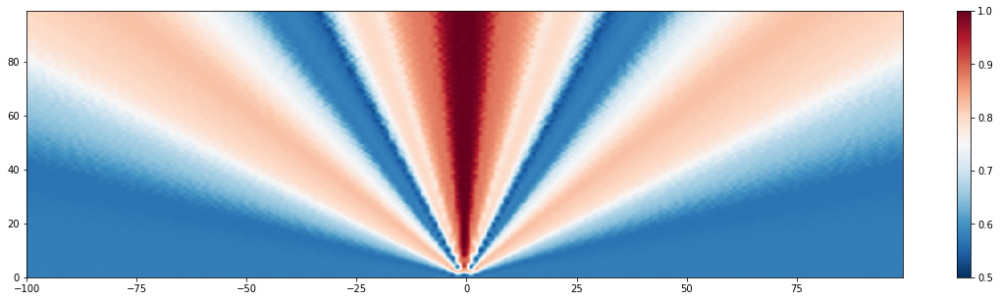

In [49]:
fig, ax = plt.subplots()

# c = ax.pcolormesh(final_x, final_y, final_grid_scores, cmap='RdBu_r', vmin=scores_min, vmax=scores_max, shading='flat')
# ax.tricontourf(test_x, test_y, scores)
# ax.set_title('pcolormesh')
# set the limits of the plot to the limits of the data
# ax.axis([-max_grid_x/2, max_grid_x/2, 0, 20])
# fig.colorbar(c, ax=ax)

xy = np.column_stack([test_x, test_y])
grid_x, grid_y = np.mgrid[min(test_x):max(test_x):1000j, min(test_y):max(test_y):1000j]
grid_z = scipy.interpolate.griddata(xy, scores,(grid_x, grid_y), method='cubic')
import numpy.ma as ma
plt.pcolormesh(grid_x, grid_y, ma.masked_invalid(grid_z), cmap='RdBu_r', vmin=0.5, vmax=1)
plt.colorbar()
plt.show()

In [50]:
play_wav_file("sounds/sound_memmemem.wav", sample_rate)

In [9]:
CHz = 261.63
EHz = 329.63
EbHz = 311.13
GHz = 392.00

In [7]:
listener_locs = gen_listener_locs(4)
source_locs = [(-10, 0), (0, 30)]
#sounds = [gen_chord([CHz, EHz, GHz], 0.1, sample_rate), gen_chord([CHz, EbHz, GHz], 0.1, sample_rate)]
sounds = [gen_tone(CHz, 0.3, sample_rate), gen_tone(GHz, 0.3, sample_rate)]

num_listeners = len(listener_locs)
num_sources = len(source_locs)

In [9]:
listener_waves = gen_listener_waves(listener_locs, source_locs, sounds, sample_rate)

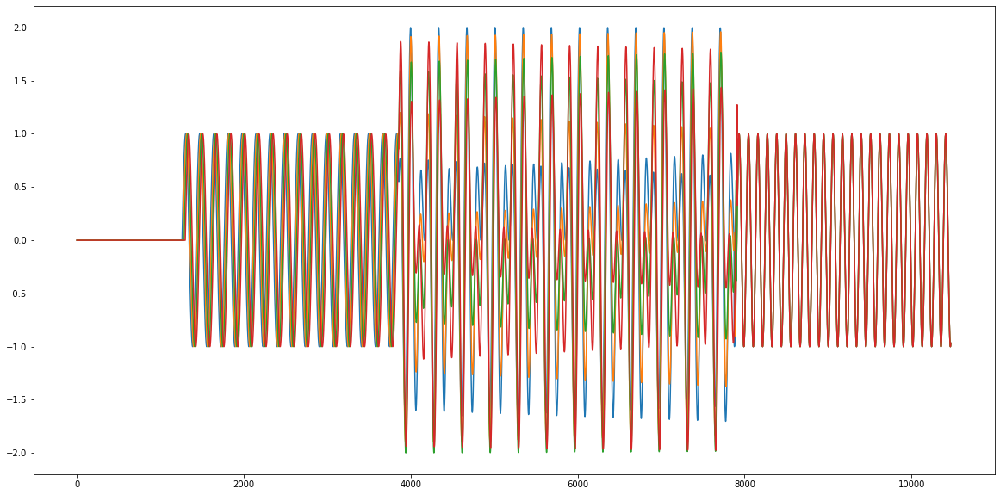

In [11]:
plt.plot(np.array(listener_waves).transpose())
plt.show()

In [11]:
#listener_waves = [add_waves(ls) for ls in listener_sounds]

# plt.plot(listener_waves)
# plt.show()

# for lw in listener_waves:
#     play_tmp(lw, sample_rate)
#     plt.plot(lw)
#     plt.show()

In [42]:
stereo = np.array(listener_waves).transpose()

In [47]:
wavio.write('stereo.wav', stereo, sd.sample_rate, sampwidth=3)

In [46]:
play('stereo.wav')

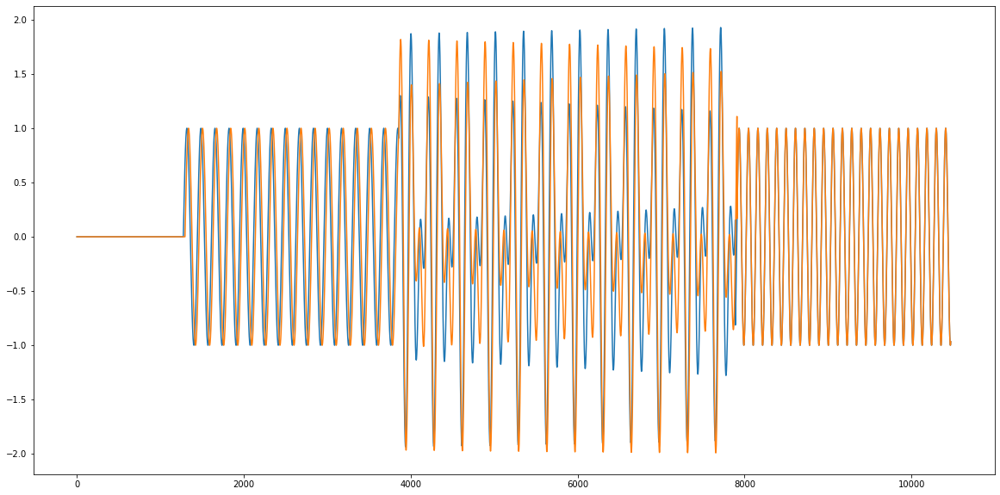

In [15]:
plt.plot(stereo)
plt.show()

In [14]:
delayed = delay(c_note, 1.5, sample_rate)

NameError: name 'c_note' is not defined

In [71]:
play_tmp(delayed, sample_rate)

In [58]:

listener_loc = (0, 0)
source_locs = [(1, 0), (0, 2 + 3 * wavelength(CHz) + wavelength(CHz)/2)]
chords = [gen_tone(CHz, 0.1, sample_rate), gen_tone(CHz, 0.1, sample_rate)]

In [43]:

listener_waves

[array([ 0.        ,  0.        ,  0.        , ..., -0.98927233,
        -0.97957525, -0.96682339]),
 array([ 0.        ,  0.        ,  0.        , ..., -0.98927233,
        -0.97957525, -0.96682339]),
 array([ 0.        ,  0.        ,  0.        , ..., -0.98927233,
        -0.97957525, -0.96682339]),
 array([ 0.        ,  0.        ,  0.        , ..., -0.98927233,
        -0.97957525, -0.96682339])]

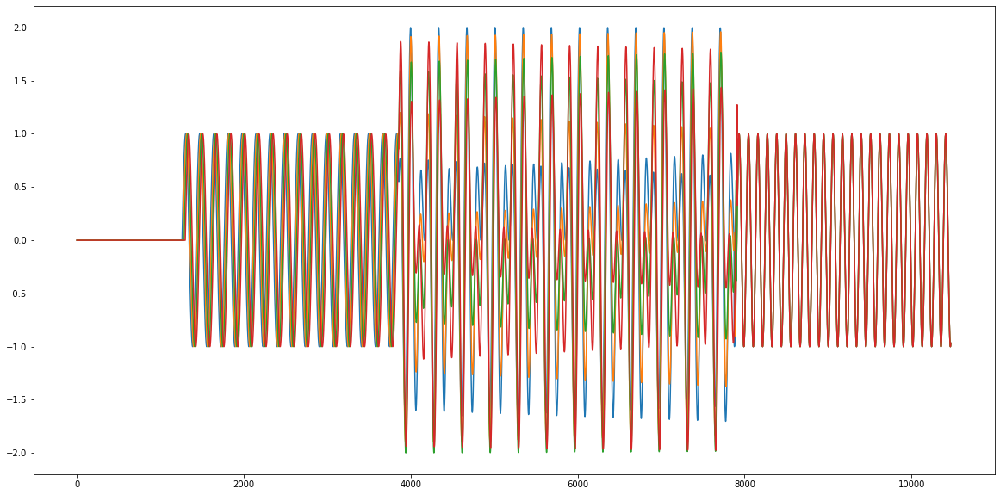

In [48]:
plt.plot(np.array(listener_waves).transpose())
plt.show()

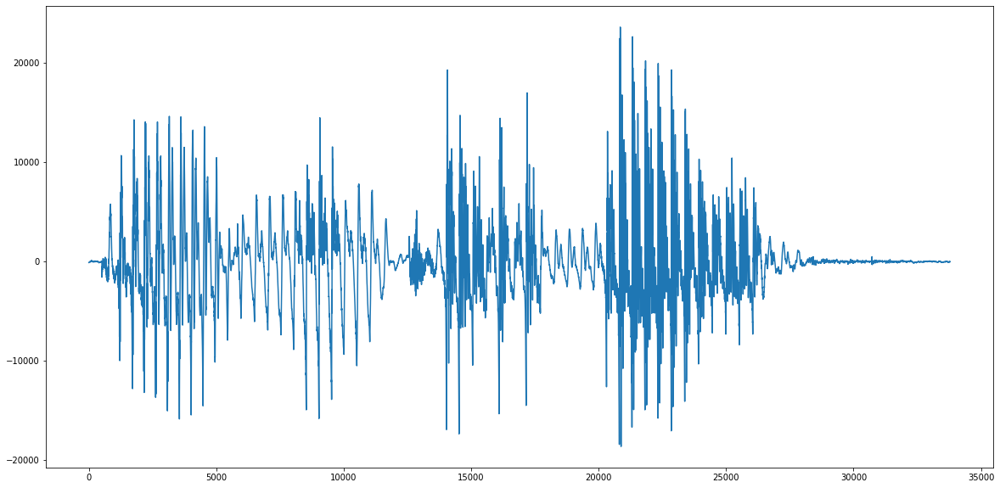

In [7]:
plot_wav_file("sounds/humans_are_dead.wav")